<a href="https://colab.research.google.com/github/Susrath11/Machine-Learning-Workflow-with-Python/blob/master/flowers_recognition_using_keras.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
from os import mkdir
import numpy as np
import pandas as pd
import tensorflow as tf
import tensorflow_hub as hub
import cv2
import matplotlib.pyplot as plt
import keras.backend as k
from keras.preprocessing.image import ImageDataGenerator
from keras.preprocessing import image
from keras.models import Model
from keras.layers import Input,Dense,Dropout
from keras.applications.inception_v3 import InceptionV3
from keras.applications.inception_v3 import preprocess_input,decode_predictions



In [0]:
import logging
logger = tf.get_logger()
logger.setLevel(logging.ERROR)

In [0]:
train_images = []
val_images = []
test_images = []

In [0]:
# Run this cell to mount your Google Drive.
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
classes = ['daisy', 'dandelion', 'rose', 'sunflower', 'tulip']

In [0]:
orig_path = "//content//drive//My Drive//flowers"
flower_daisy_dir="//content//drive//My Drive//flowers//daisy"
flower_sunflower_dir="//content//drive//My Drive//flowers//sunflower"

flower_tulip_dir="//content//drive//My Drive//flowers//tulip"
flower_dandi_dir="//content//drive//My Drive//flowers//dandi"

flower_rose_dir="//content//drive//My Drive//flowers//rose"


In [0]:
orgin_path = "//content//drive//My Drive//flowers//"
image_datagen = ImageDataGenerator(rotation_range=20, width_shift_range=0.2, height_shift_range=0.2, horizontal_flip=True, rescale=1./255, validation_split=0.15)  

train_gen = image_datagen.flow_from_directory(orgin_path, target_size=(299, 299), batch_size=32, class_mode="categorical", subset="training")
valid_gen = image_datagen.flow_from_directory(orgin_path, target_size=(299, 299), batch_size=32, class_mode="categorical", subset="validation")

Found 3677 images belonging to 5 classes.
Found 646 images belonging to 5 classes.


In [0]:
inp=Input((299,299,3))
inception = InceptionV3(include_top=False,weights='imagenet', input_tensor=inp, input_shape=(299,299,3), pooling='avg')
x=inception.output
x=Dense(256, activation='relu')(x)
x=Dropout(0.1)(x)
out=Dense(5, activation='softmax')(x)
                        
complete_model=Model(inp,out)
                        
complete_model.compile(optimizer='adam',loss='categorical_crossentropy')
                        

87916544/87910968 [==============================] - 1s 0us/step


In [0]:
history = complete_model.fit_generator(train_gen,steps_per_epoch=115,epochs=10,validation_data=valid_gen,validation_steps=20,verbose=1)

Epoch 1/10
115/115 [==============================] - 1176s 10s/step - loss: 0.7562 - val_loss: 1.9957
Epoch 2/10
115/115 [==============================] - 97s 846ms/step - loss: 0.5762 - val_loss: 1.3424
Epoch 3/10
115/115 [==============================] - 98s 851ms/step - loss: 0.4562 - val_loss: 0.8847
Epoch 4/10
115/115 [==============================] - 99s 861ms/step - loss: 0.4225 - val_loss: 1.5392
Epoch 5/10
115/115 [==============================] - 99s 861ms/step - loss: 0.3976 - val_loss: 0.6892
Epoch 6/10
115/115 [==============================] - 99s 860ms/step - loss: 0.3327 - val_loss: 0.5832
Epoch 7/10
115/115 [==============================] - 99s 857ms/step - loss: 0.3387 - val_loss: 0.6491
Epoch 8/10
115/115 [==============================] - 99s 865ms/step - loss: 0.2927 - val_loss: 0.4961
Epoch 9/10
115/115 [==============================] - 99s 861ms/step - loss: 0.3181 - val_loss: 0.6933
Epoch 10/10
115/115 [==============================] - 101s 875ms/step - 

In [0]:
# Taking the outputs of first 100 layers from trained model, leaving the first Input layer, in a list
layer_outputs = [layer.output for layer in complete_model.layers[1:100]]

# This is image of a Rose flower from our dataset. All of the visualizations in this cell are of this image.
test_image = orgin_path+"/rose/2258973326_03c0145f15_n.jpg"

# Loading the image and converting it to a numpy array for feeding it to the model. Its important to use expand_dims since our original model takes batches of images
# as input, and here we are feeding a single image to it, so the number of dimensions should match for model input.
img = image.load_img(test_image, target_size=(299, 299))
img_arr = image.img_to_array(img)
img_arr = np.expand_dims(img_arr, axis=0)
img_arr /= 255.

# Defining a new model using original model's input and all the 100 layers outputs and then predicting the values for all those 100 layers for our test image.
activation_model = Model(inputs=complete_model.input, outputs=layer_outputs)
activations = activation_model.predict(img_arr)

# These are names of layers, the outputs of which we are going to visualize.
layer_names = ['conv2d_1', 'activation_1', 'conv2d_4', 'activation_4', 'conv2d_9', 'activation_9']
activ_list = [activations[0], activations[2], activations[10], activations[12], activations[17], activations[19]]

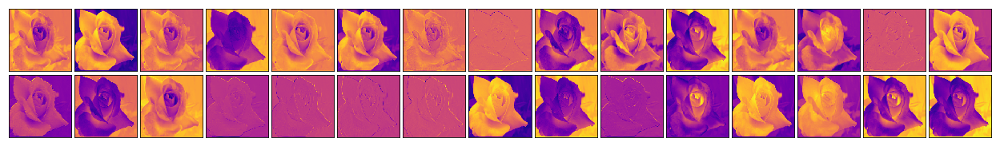

In [0]:
fig = plt.figure(figsize=(22, 3))
for img in range(30):
    ax = fig.add_subplot(2, 15, img+1)
    ax = plt.imshow(activations[0][0, :, :, img], cmap='plasma')
    plt.xticks([])
    plt.yticks([])
    fig.subplots_adjust(wspace=0.05, hspace=0.05)

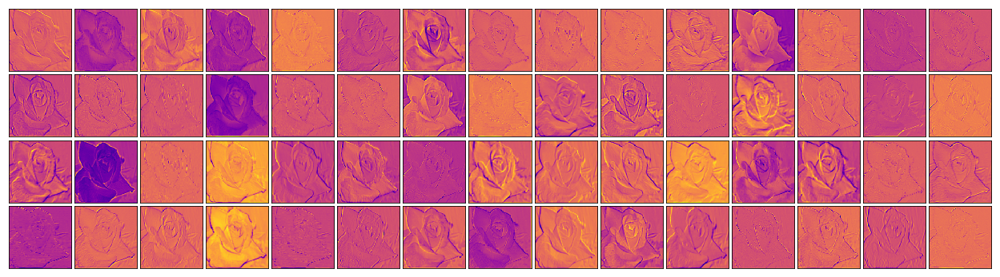

In [0]:
fig = plt.figure(figsize=(22, 6))
for img in range(60):
    ax = fig.add_subplot(4, 15, img+1)
    ax = plt.imshow(activations[6][0, :, :, img], cmap='plasma')
    plt.xticks([])
    plt.yticks([])
    fig.subplots_adjust(wspace=0.05, hspace=0.05)

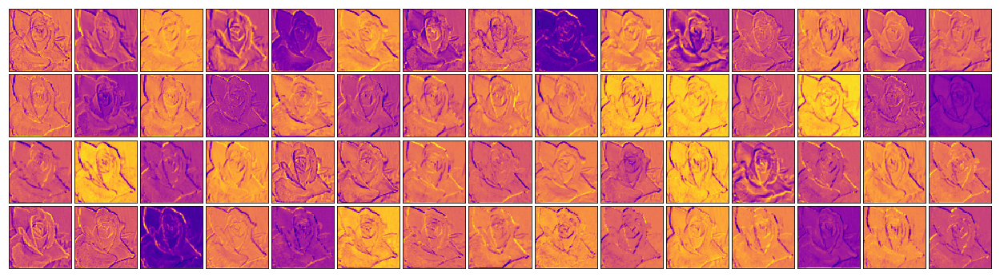

In [0]:
fig = plt.figure(figsize=(22, 6))
for img in range(60):
    ax = fig.add_subplot(4, 15, img+1)
    ax = plt.imshow(activations[10][0, :, :, img], cmap='plasma')
    plt.xticks([])
    plt.yticks([])
    fig.subplots_adjust(wspace=0.05, hspace=0.05)

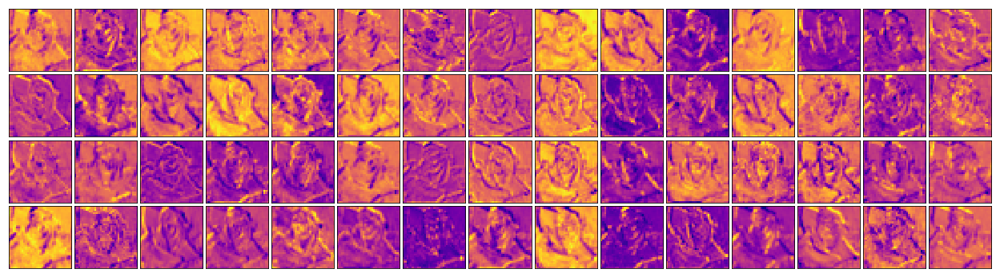

In [0]:
fig = plt.figure(figsize=(22, 6))
for img in range(60):
    ax = fig.add_subplot(4, 15, img+1)
    ax = plt.imshow(activations[17][0, :, :, img], cmap='plasma')
    plt.xticks([])
    plt.yticks([])
    fig.subplots_adjust(wspace=0.05, hspace=0.05)

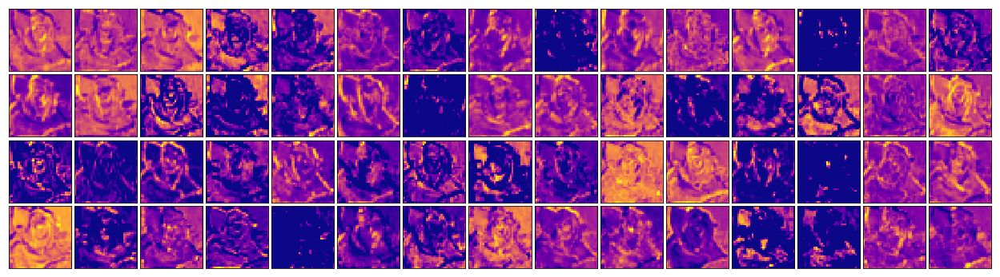

In [0]:
fig = plt.figure(figsize=(22, 6))
for img in range(60):
    ax = fig.add_subplot(4, 15, img+1)
    ax = plt.imshow(activations[39][0, :, :, img], cmap='plasma')
    plt.xticks([])
    plt.yticks([])
    fig.subplots_adjust(wspace=0.05, hspace=0.05)

In [0]:
def deprocess_image(x):
    
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.1
    x += 0.5
    x = np.clip(x, 0, 1)
    x *= 255
    x = np.clip(x, 0, 255).astype('uint8')

    return x

In [0]:
from keras import backend as K

In [0]:
def generate_pattern(layer_name, filter_index, size=150):
    
    layer_output = complete_model.get_layer(layer_name).output
    loss = K.mean(layer_output[:, :, :, filter_index])
    grads = K.gradients(loss, complete_model.input)[0]
    grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)
    iterate = K.function([complete_model.input], [loss, grads])
    input_img_data = np.random.random((1, size, size, 3)) * 20 + 128.
    step = 1.
    for i in range(80):
        loss_value, grads_value = iterate([input_img_data])
        input_img_data += grads_value * step
        
    img = input_img_data[0]
    return deprocess_image(img)

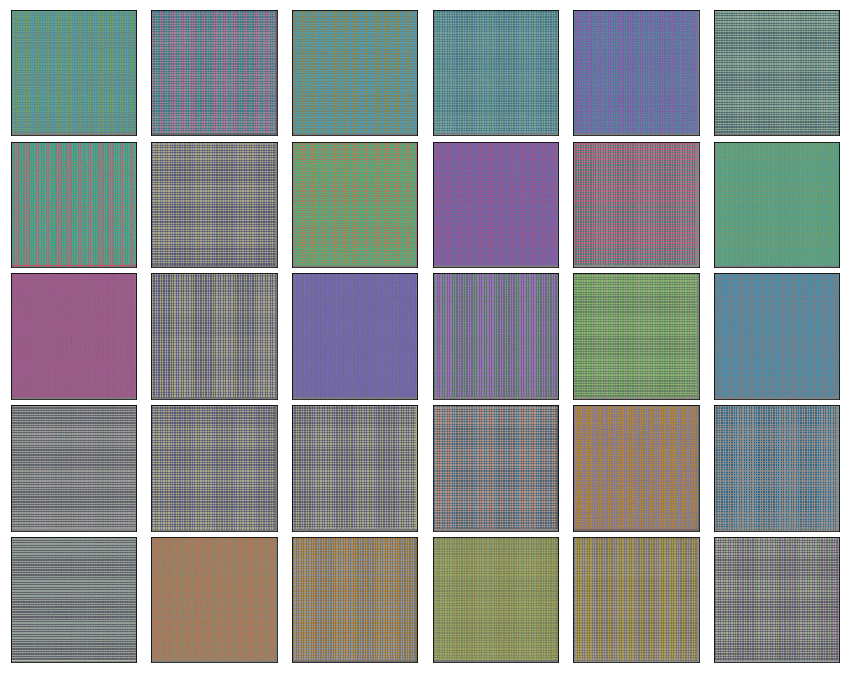

In [0]:
fig = plt.figure(figsize=(15, 12))
for img in range(30):
    ax = fig.add_subplot(5, 6, img+1)
    ax = plt.imshow(generate_pattern('conv2d_1', img))
    plt.xticks([])
    plt.yticks([])
    fig.subplots_adjust(wspace=0.05, hspace=0.05)

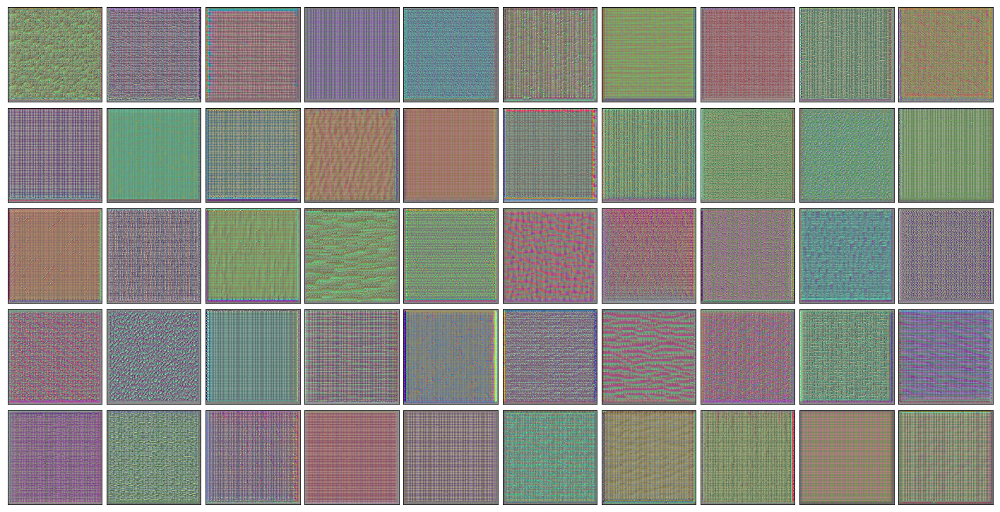

In [0]:
fig = plt.figure(figsize=(25, 13))
for img in range(50):
    ax = fig.add_subplot(5, 10, img+1)
    ax = plt.imshow(generate_pattern('conv2d_3', img))
    plt.xticks([])
    plt.yticks([])
    fig.subplots_adjust(wspace=0.05, hspace=0.05)

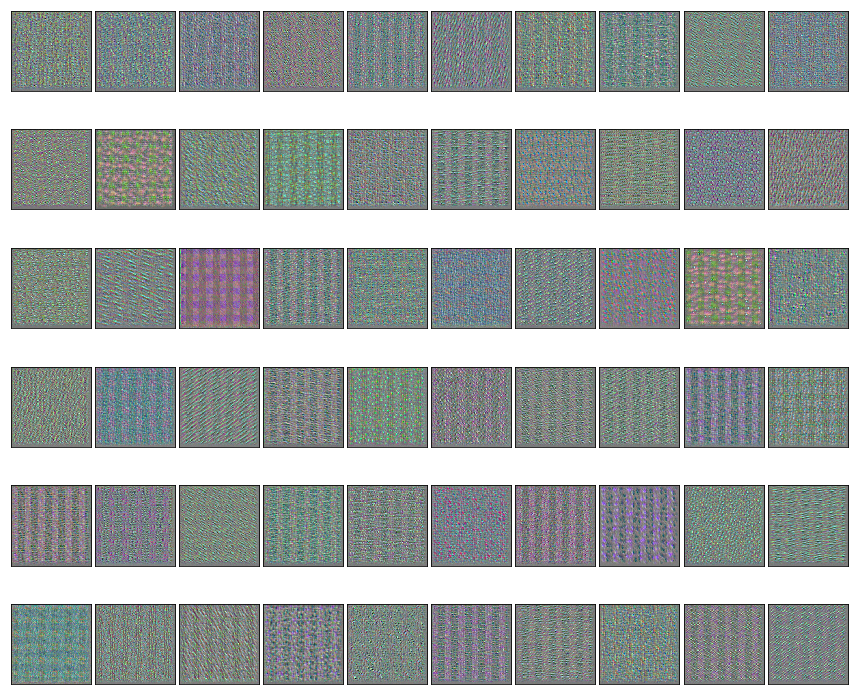

In [0]:
fig = plt.figure(figsize=(15, 13))
for img in range(60):
    ax = fig.add_subplot(6, 10, img+1)
    ax = plt.imshow(generate_pattern('conv2d_4', img))
    plt.xticks([])
    plt.yticks([])
    fig.subplots_adjust(wspace=0.05, hspace=0.05)

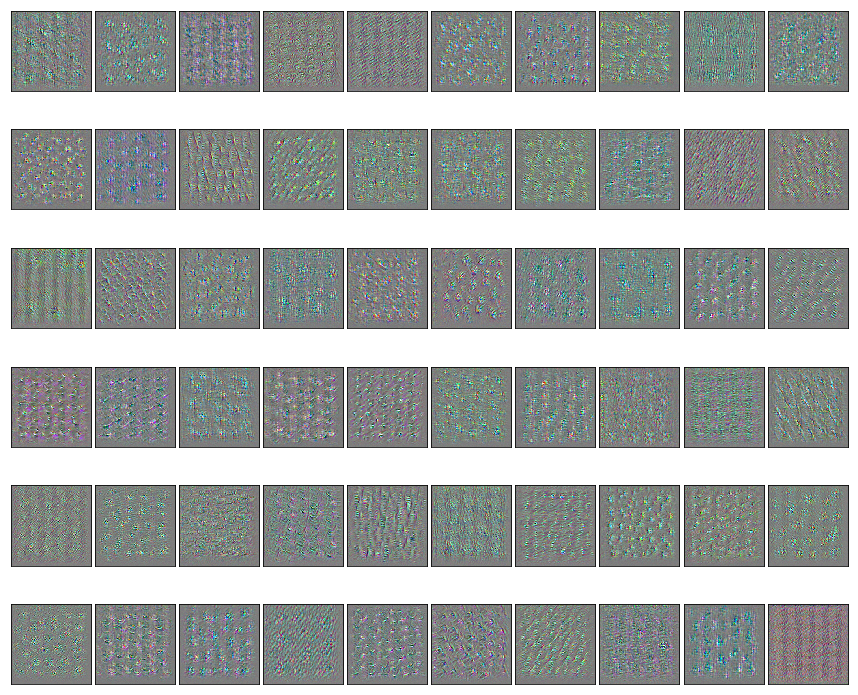

In [0]:
fig = plt.figure(figsize=(15, 13))
for img in range(60):
    ax = fig.add_subplot(6, 10, img+1)
    ax = plt.imshow(generate_pattern('conv2d_9', img))
    plt.xticks([])
    plt.yticks([])
    fig.subplots_adjust(wspace=0.05, hspace=0.05)


In [0]:
img_path = orgin_path+'/daisy/9158041313_7a6a102f7a_n.jpg'

img = image.load_img(img_path, target_size=(299, 299))
x = image.img_to_array(img)
x = np.expand_dims(x, axis=0)
x = preprocess_input(x)

preds = complete_model.predict(x)
preds

array([[9.9944049e-01, 1.7166222e-04, 1.8150426e-05, 1.9900664e-05,
        3.4975357e-04]], dtype=float32)

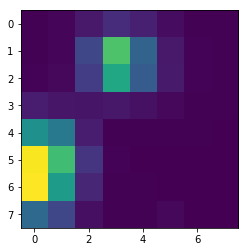

In [0]:
# 0 is the class index for class 'Daisy' in Flowers dataset
flower_output = complete_model.output[:, 0]
last_conv_layer = complete_model.get_layer('mixed10')

grads = K.gradients(flower_output, last_conv_layer.output)[0]                               # Gradient of output with respect to 'mixed10' layer
pooled_grads = K.mean(grads, axis=(0, 1, 2))                                                # Vector of size (2048,), where each entry is mean intensity of
                                                                                            # gradient over a specific feature-map channel
iterate = K.function([complete_model.input], [pooled_grads, last_conv_layer.output[0]])
pooled_grads_value, conv_layer_output_value = iterate([x])

#2048 is the number of filters/channels in 'mixed10' layer
for i in range(2048):                                                                       # Multiplies each channel in feature-map array by "how important this
        conv_layer_output_value[:, :, i] *= pooled_grads_value[i]                           # channel is" with regard to the class
        
heatmap = np.mean(conv_layer_output_value, axis=-1)
heatmap = np.maximum(heatmap, 0)                                                            # Following two lines just normalize heatmap between 0 and 1
heatmap /= np.max(heatmap)

plt.imshow(heatmap)

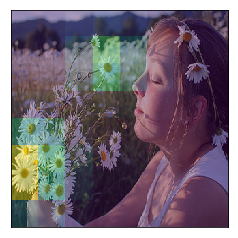

In [0]:
img = plt.imread(img_path)
extent = 0, 300, 0, 300
fig = plt.Figure(frameon=False)

img1 = plt.imshow(img, extent=extent)
img2 = plt.imshow(heatmap, cmap='viridis', alpha=0.4, extent=extent)

plt.xticks([])
plt.yticks([])
plt.show()

In [0]:
img_path = orgin_path+'/dandelion/458011386_ec89115a19.jpg'

img = image.load_img(img_path, target_size=(299, 299))
x = image.img_to_array(img)
x = np.expand_dims(x, axis=0)
x = preprocess_input(x)

preds = complete_model.predict(x)
preds

array([[0.31270728, 0.41864035, 0.1054542 , 0.0177973 , 0.1454009 ]],
      dtype=float32)

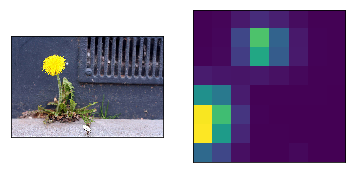

In [0]:
img = plt.imread(img_path)

plt.subplot(121)
plt.imshow(img)
plt.xticks([])
plt.yticks([])

plt.subplot(122)
plt.imshow(heatmap)
plt.xticks([])
plt.yticks([])

plt.show()

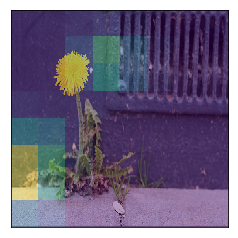

In [0]:
img = plt.imread(img_path)
extent = 0, 300, 0, 300
fig = plt.Figure(frameon=False)

img1 = plt.imshow(img, extent=extent)
img2 = plt.imshow(heatmap, cmap='viridis', alpha=0.4, extent=extent)

plt.xticks([])
plt.yticks([])
plt.show()